# 考虑abcd

In [1]:
import numpy as np
import torch
from torch.utils.data import Dataset

def H(x):
    return np.where((0 <= x) & (x <= np.pi), x / 2, np.pi - x / 2)

hbar = 1

class VelocityFieldDataset(Dataset):
    def __init__(self, num_samples, size):
        self.num_samples = num_samples
        self.size = size
        self.full_velocity_fields = []
        self.masked_velocity_fields = []
        self.abcd_params = []
        for _ in range(num_samples):
            a, b, c, d = self.generate_abcd_params(size)
            ux, uy = self.calculate_velocity_field(a, b, c, d)
            full_velocity_field = np.stack([ux, uy], axis=0)
            mask = self.generate_random_mask(size, size)
            masked_velocity_field = self.apply_mask(torch.tensor(full_velocity_field), torch.tensor(mask))
            self.full_velocity_fields.append(full_velocity_field)
            self.masked_velocity_fields.append(masked_velocity_field)
            self.abcd_params.append(np.stack([a, b, c, d], axis=0))

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        return self.masked_velocity_fields[idx], self.full_velocity_fields[idx], self.abcd_params[idx]

    def generate_abcd_params(self, size):
        x = np.linspace(0, 2 * np.pi, size)
        y = np.linspace(0, 2 * np.pi, size)
        X, Y = np.meshgrid(x, y)
        a = np.cos(H(X)) * np.cos(np.cos(Y) * (2 - np.cos(X)) / hbar)
        b = np.cos(H(X)) * np.sin(np.cos(Y) * (2 - np.cos(X)) / hbar)
        c = np.sin(H(X)) * np.cos(np.cos(Y) * (2 + np.cos(X)) / hbar)
        d = -np.sin(H(X)) * np.sin(np.cos(Y) * (2 + np.cos(X)) / hbar)
        return a, b, c, d

    def calculate_velocity_field(self, a, b, c, d):
        ux = a * b - c * d
        uy = a * c + b * d
        return ux, uy

    def generate_random_mask(self, height, width):
        mask = np.ones((height, width), dtype=np.float32)
        mask_size =8
        x_start = np.random.randint(0, height - mask_size)
        y_start = np.random.randint(0, width - mask_size)
        mask[x_start:x_start + mask_size, y_start:y_start + mask_size] = 0
        return mask

    def apply_mask(self, velocity_field, mask):
        masked_velocity_field = velocity_field.clone()
        masked_velocity_field[:, mask == 0] = 0
        return masked_velocity_field

import torch
import torch.nn as nn
import torch.nn.functional as F

class ParameterNetwork(nn.Module):
    def __init__(self):
        super(ParameterNetwork, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(2, 64, kernel_size=5, stride=1, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True)
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 4, kernel_size=3, stride=1, padding=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

import torch.optim as optim
from torch.utils.data import DataLoader

def calculate_velocity_field(a, b, c, d):
    ux = a * b - c * d
    uy = a * c + b * d
    return ux, uy

def velocity_loss(ux_pred, uy_pred, ux_true, uy_true):
    return F.mse_loss(ux_pred, ux_true) + F.mse_loss(uy_pred, uy_true)

# 初始化数据集和数据加载器
num_samples = 1000
size = 64
dataset = VelocityFieldDataset(num_samples, size)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# 初始化模型
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ParameterNetwork().to(device)

# 优化器
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# 训练循环
num_epochs = 1000
for epoch in range(num_epochs):
    for masked_velocity_field, full_velocity_field, abcd_params in dataloader:
        masked_velocity_field = masked_velocity_field.to(device).float()
        full_velocity_field = full_velocity_field.to(device).float()
        abcd_params = abcd_params.to(device).float()

        # 训练模型
        optimizer.zero_grad()
        abcd_pred = model(masked_velocity_field)
        a_pred, b_pred, c_pred, d_pred = torch.split(abcd_pred, 1, dim=1)
        a_true, b_true, c_true, d_true = torch.split(abcd_params, 1, dim=1)
        ux_pred, uy_pred = calculate_velocity_field(a_pred, b_pred, c_pred, d_pred)
        ux_true, uy_true = calculate_velocity_field(a_true, b_true, c_true, d_true)
        loss = velocity_loss(ux_pred, uy_pred, ux_true, uy_true)
        loss.backward()
        optimizer.step()

# 保存模型
torch.save(model.state_dict(), 'parameter_network.pth')


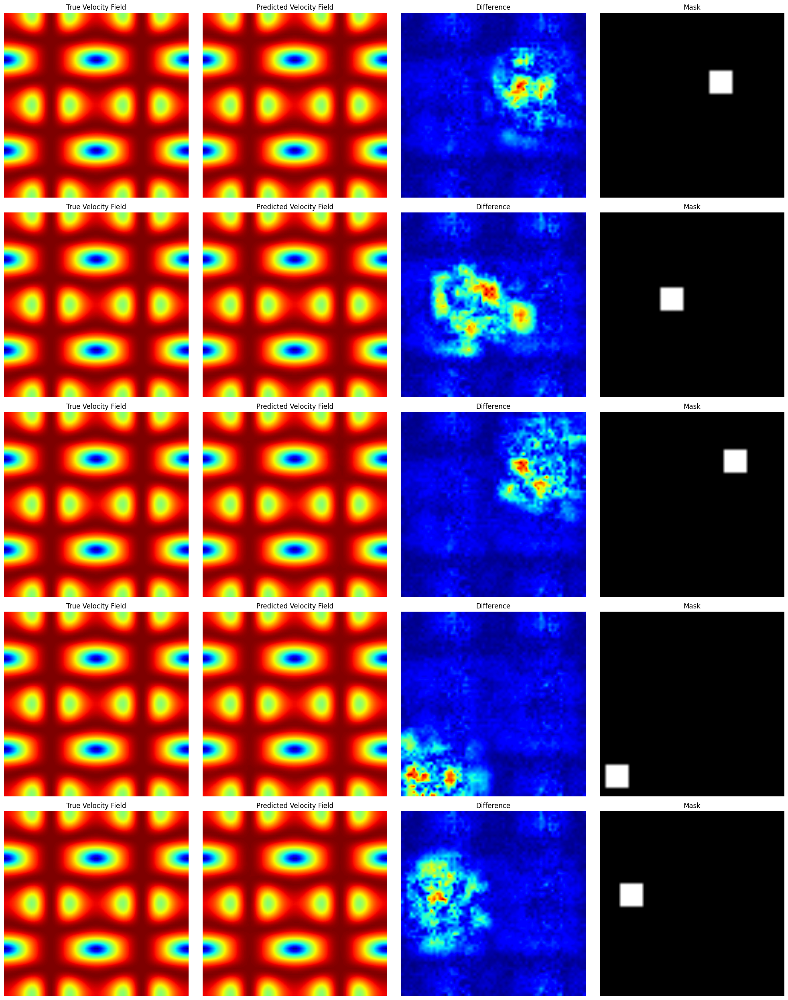

In [2]:
import matplotlib.pyplot as plt
import random

# 加载模型
model = ParameterNetwork().to(device)
model.load_state_dict(torch.load('parameter_network.pth'))
model.eval()

# 随机选择一些样本进行可视化
num_samples_to_visualize = 5
samples = random.sample(range(len(dataset)), num_samples_to_visualize)

def plot_velocity_field(ax, ux, uy, title):
    U_magnitude = np.sqrt(ux**2 + uy**2)
    ax.imshow(U_magnitude, cmap='jet', interpolation='bilinear')
    ax.set_title(title)
    ax.axis('off')

fig, axs = plt.subplots(num_samples_to_visualize, 4, figsize=(20, 5 * num_samples_to_visualize))

for i, sample_idx in enumerate(samples):
    masked_velocity_field, full_velocity_field, abcd_params = dataset[sample_idx]
    masked_velocity_field = masked_velocity_field.to(device).float().unsqueeze(0)
    mask = (masked_velocity_field[0, 0] == 0).float().cpu().numpy()  # 获取掩码

    with torch.no_grad():
        abcd_pred = model(masked_velocity_field)
        a_pred, b_pred, c_pred, d_pred = torch.split(abcd_pred.squeeze(0), 1, dim=0)
        a_pred = a_pred.cpu().numpy().squeeze()
        b_pred = b_pred.cpu().numpy().squeeze()
        c_pred = c_pred.cpu().numpy().squeeze()
        d_pred = d_pred.cpu().numpy().squeeze()
        ux_pred, uy_pred = calculate_velocity_field(a_pred, b_pred, c_pred, d_pred)

    ux_true, uy_true = full_velocity_field[0], full_velocity_field[1]

    plot_velocity_field(axs[i, 0], ux_true, uy_true, 'True Velocity Field')
    plot_velocity_field(axs[i, 1], ux_pred, uy_pred, 'Predicted Velocity Field')
    plot_velocity_field(axs[i, 2], ux_true - ux_pred, uy_true - uy_pred, 'Difference')
    axs[i, 3].imshow(mask, cmap='gray', interpolation='bilinear')
    axs[i, 3].set_title('Mask')
    axs[i, 3].axis('off')

plt.tight_layout()
plt.show()


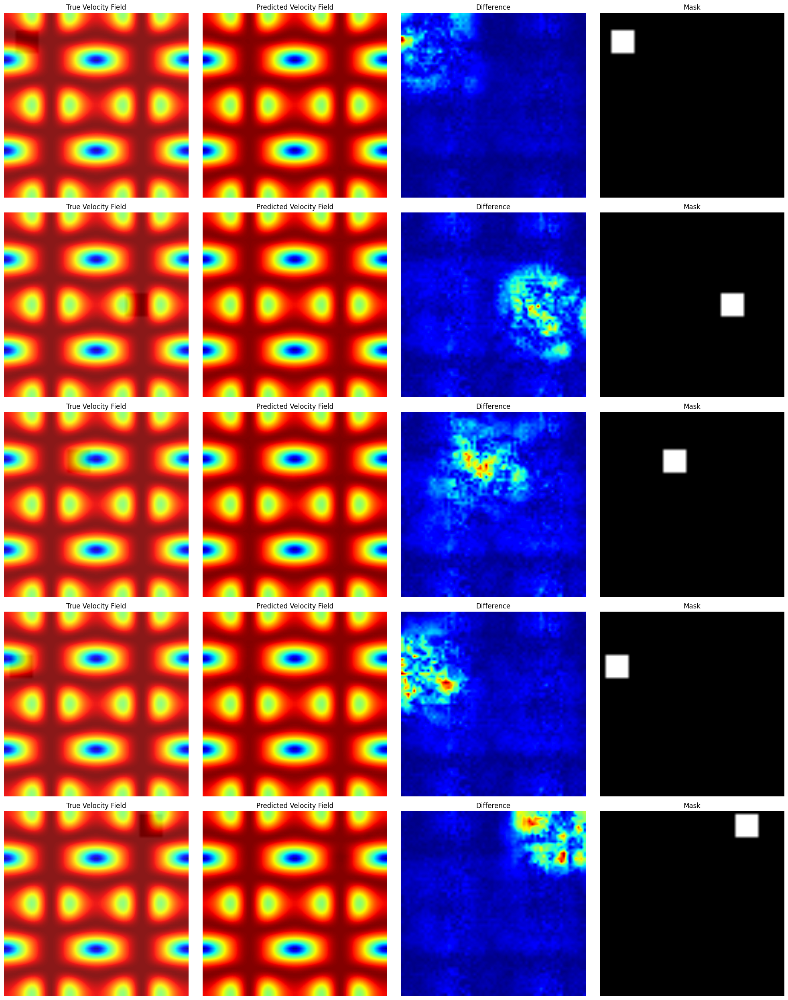

In [3]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import random

def plot_velocity_field(ax, ux, uy, mask, title):
    U_magnitude = np.sqrt(ux**2 + uy**2)
    ax.imshow(U_magnitude, cmap='jet', interpolation='bilinear')
    if mask is not None:
        mask_overlay = np.zeros_like(U_magnitude)
        mask_overlay[mask == 0] = 10  # 将掩码区域设为白色
        ax.imshow(mask_overlay, cmap='gray', alpha=0.1, interpolation='bilinear')
    ax.set_title(title)
    ax.axis('off')

# 加载模型
model = ParameterNetwork().to(device)
model.load_state_dict(torch.load('parameter_network.pth'))
model.eval()

# 随机选择一些样本进行可视化
num_samples_to_visualize = 5
samples = random.sample(range(len(dataset)), num_samples_to_visualize)

fig, axs = plt.subplots(num_samples_to_visualize, 4, figsize=(20, 5 * num_samples_to_visualize))

for i, sample_idx in enumerate(samples):
    masked_velocity_field, full_velocity_field, abcd_params = dataset[sample_idx]
    masked_velocity_field = masked_velocity_field.to(device).float().unsqueeze(0)
    mask = (masked_velocity_field[0, 0] == 0).float().cpu().numpy()  # 获取掩码

    with torch.no_grad():
        abcd_pred = model(masked_velocity_field)
        a_pred, b_pred, c_pred, d_pred = torch.split(abcd_pred.squeeze(0), 1, dim=0)
        a_pred = a_pred.cpu().numpy().squeeze()
        b_pred = b_pred.cpu().numpy().squeeze()
        c_pred = c_pred.cpu().numpy().squeeze()
        d_pred = d_pred.cpu().numpy().squeeze()
        ux_pred, uy_pred = calculate_velocity_field(a_pred, b_pred, c_pred, d_pred)

    ux_true, uy_true = full_velocity_field[0], full_velocity_field[1]

    plot_velocity_field(axs[i, 0], ux_true, uy_true, mask, 'True Velocity Field')
    plot_velocity_field(axs[i, 1], ux_pred, uy_pred, None, 'Predicted Velocity Field')
    plot_velocity_field(axs[i, 2], ux_true - ux_pred, uy_true - uy_pred, None, 'Difference')
    axs[i, 3].imshow(mask, cmap='gray', interpolation='bilinear')
    axs[i, 3].set_title('Mask')
    axs[i, 3].axis('off')

plt.tight_layout()
plt.show()


# 不考虑abcd

In [4]:
class VelocityFieldDatasetNoABCD(Dataset):
    def __init__(self, num_samples, size):
        self.num_samples = num_samples
        self.size = size
        self.full_velocity_fields = []
        self.masked_velocity_fields = []
        for _ in range(num_samples):
            a, b, c, d = self.generate_abcd_params(size)
            ux, uy = self.calculate_velocity_field(a, b, c, d)
            full_velocity_field = np.stack([ux, uy], axis=0)
            mask = self.generate_random_mask(size, size)
            masked_velocity_field = self.apply_mask(torch.tensor(full_velocity_field), torch.tensor(mask))
            self.full_velocity_fields.append(full_velocity_field)
            self.masked_velocity_fields.append(masked_velocity_field)

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        return self.masked_velocity_fields[idx], self.full_velocity_fields[idx]

    def generate_abcd_params(self, size):
        x = np.linspace(0, 2 * np.pi, size)
        y = np.linspace(0, 2 * np.pi, size)
        X, Y = np.meshgrid(x, y)
        a = np.cos(H(X)) * np.cos(np.cos(Y) * (2 - np.cos(X)) / hbar)
        b = np.cos(H(X)) * np.sin(np.cos(Y) * (2 - np.cos(X)) / hbar)
        c = np.sin(H(X)) * np.cos(np.cos(Y) * (2 + np.cos(X)) / hbar)
        d = -np.sin(H(X)) * np.sin(np.cos(Y) * (2 + np.cos(X)) / hbar)
        return a, b, c, d

    def calculate_velocity_field(self, a, b, c, d):
        ux = a * b - c * d
        uy = a * c + b * d
        return ux, uy

    def generate_random_mask(self, height, width):
        mask = np.ones((height, width), dtype=np.float32)
        mask_size = 8  # 设置掩码的大小为 8x8
        x_start = np.random.randint(0, height - mask_size)
        y_start = np.random.randint(0, width - mask_size)
        mask[x_start:x_start + mask_size, y_start:y_start + mask_size] = 0
        return mask

    def apply_mask(self, velocity_field, mask):
        masked_velocity_field = velocity_field.clone()
        masked_velocity_field[:, mask == 0] = 0
        return masked_velocity_field


In [5]:
class SimpleCompletionNetwork(nn.Module):
    def __init__(self):
        super(SimpleCompletionNetwork, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(2, 64, kernel_size=5, stride=1, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True)
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 2, kernel_size=3, stride=1, padding=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


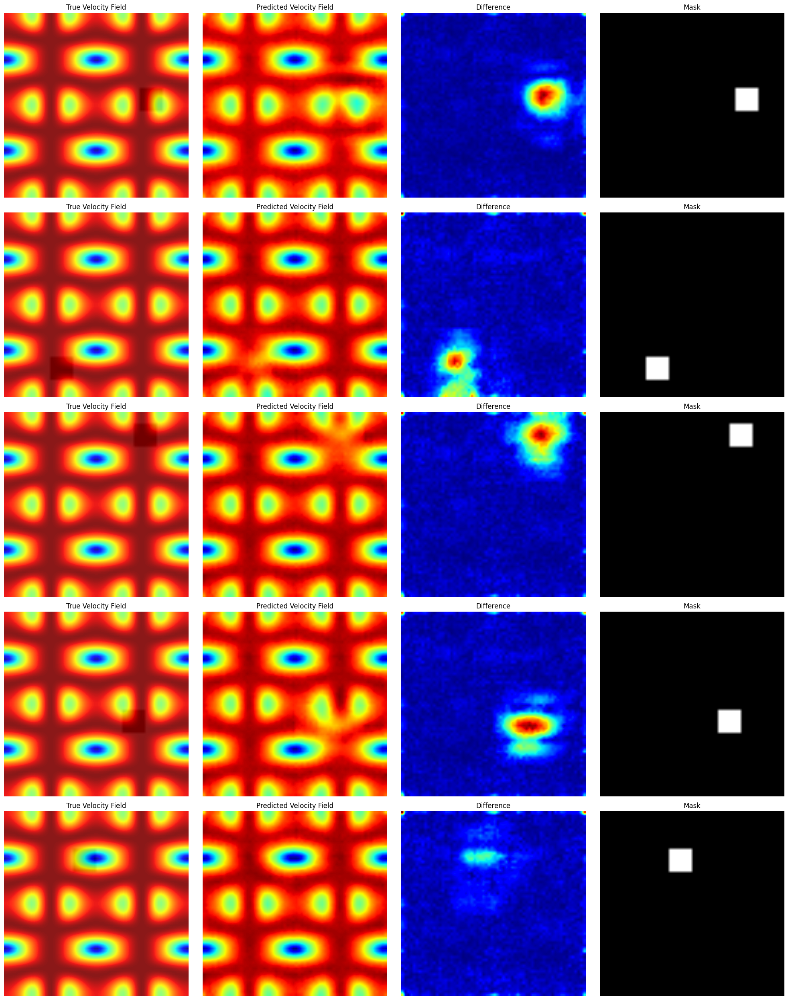

In [6]:
# 初始化数据集和数据加载器
num_samples = 1000
size = 64
dataset_no_abcd = VelocityFieldDatasetNoABCD(num_samples, size)
dataloader_no_abcd = DataLoader(dataset_no_abcd, batch_size=32, shuffle=True)

# 初始化模型
model_no_abcd = SimpleCompletionNetwork().to(device)

# 优化器
optimizer_no_abcd = optim.Adam(model_no_abcd.parameters(), lr=1e-4)

# 训练循环
num_epochs = 20
for epoch in range(num_epochs):
    for masked_velocity_field, full_velocity_field in dataloader_no_abcd:
        masked_velocity_field = masked_velocity_field.to(device).float()
        full_velocity_field = full_velocity_field.to(device).float()

        # 训练模型
        optimizer_no_abcd.zero_grad()
        velocity_pred = model_no_abcd(masked_velocity_field)
        ux_pred, uy_pred = torch.split(velocity_pred, 1, dim=1)
        ux_true, uy_true = torch.split(full_velocity_field, 1, dim=1)
        loss = velocity_loss(ux_pred, uy_pred, ux_true, uy_true)
        loss.backward()
        optimizer_no_abcd.step()

# 保存模型
torch.save(model_no_abcd.state_dict(), 'simple_completion_network.pth')

# 预测并可视化结果
model_no_abcd.eval()
fig, axs = plt.subplots(num_samples_to_visualize, 4, figsize=(20, 5 * num_samples_to_visualize))

for i, sample_idx in enumerate(samples):
    masked_velocity_field, full_velocity_field = dataset_no_abcd[sample_idx]
    masked_velocity_field = masked_velocity_field.to(device).float().unsqueeze(0)
    mask = (masked_velocity_field[0, 0] == 0).float().cpu().numpy()  # 获取掩码

    with torch.no_grad():
        velocity_pred = model_no_abcd(masked_velocity_field)
        ux_pred, uy_pred = torch.split(velocity_pred.squeeze(0), 1, dim=0)
        ux_pred = ux_pred.cpu().numpy().squeeze()
        uy_pred = uy_pred.cpu().numpy().squeeze()

    ux_true, uy_true = full_velocity_field[0], full_velocity_field[1]

    plot_velocity_field(axs[i, 0], ux_true, uy_true, mask, 'True Velocity Field')
    plot_velocity_field(axs[i, 1], ux_pred, uy_pred, None, 'Predicted Velocity Field')
    plot_velocity_field(axs[i, 2], ux_true - ux_pred, uy_true - uy_pred, None, 'Difference')
    axs[i, 3].imshow(mask, cmap='gray', interpolation='bilinear')
    axs[i, 3].set_title('Mask')
    axs[i, 3].axis('off')

plt.tight_layout()
plt.show()


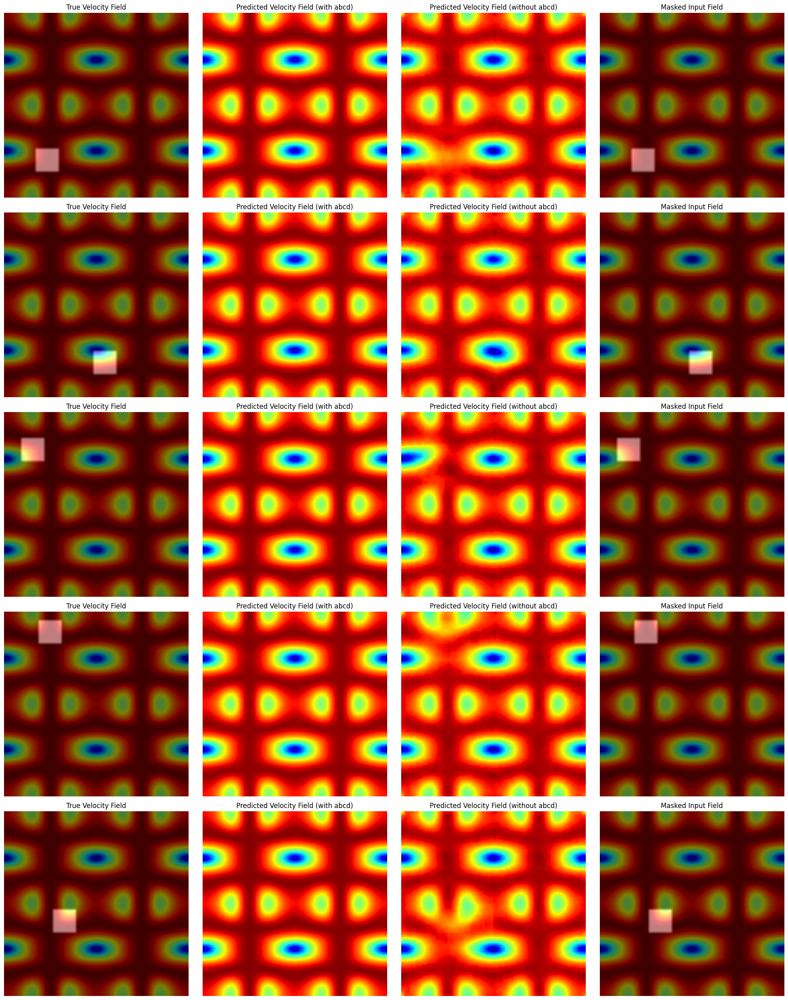

In [7]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import random

# 定义常数
hbar = 1

# 定义 H(x)
def H(x):
    return np.where((0 <= x) & (x <= np.pi), x / 2, np.pi - x / 2)

def generate_abcd_params(size):
    x = np.linspace(0, 2 * np.pi, size)
    y = np.linspace(0, 2 * np.pi, size)
    X, Y = np.meshgrid(x, y)
    a = np.cos(H(X)) * np.cos(np.cos(Y) * (2 - np.cos(X)) / hbar)
    b = np.cos(H(X)) * np.sin(np.cos(Y) * (2 - np.cos(X)) / hbar)
    c = np.sin(H(X)) * np.cos(np.cos(Y) * (2 + np.cos(X)) / hbar)
    d = -np.sin(H(X)) * np.sin(np.cos(Y) * (2 + np.cos(X)) / hbar)
    return a, b, c, d

def calculate_velocity_field(a, b, c, d):
    ux = a * b - c * d
    uy = a * c + b * d
    return ux, uy

def generate_random_mask(height, width):
    mask = np.ones((height, width), dtype=np.float32)
    mask_size = 8
    x_start = np.random.randint(0, height - mask_size)
    y_start = np.random.randint(0, width - mask_size)
    mask[x_start:x_start + mask_size, y_start:y_start + mask_size] = 0
    return mask

def apply_mask(velocity_field, mask):
    masked_velocity_field = velocity_field.copy()
    masked_velocity_field[:, mask == 0] = 0
    return masked_velocity_field

# 生成新数据
def generate_new_data(num_samples, size):
    full_velocity_fields = []
    masked_velocity_fields = []
    abcd_params = []
    masks = []
    for _ in range(num_samples):
        a, b, c, d = generate_abcd_params(size)
        ux, uy = calculate_velocity_field(a, b, c, d)
        full_velocity_field = np.stack([ux, uy], axis=0)
        mask = generate_random_mask(size, size)
        masked_velocity_field = apply_mask(full_velocity_field, mask)
        full_velocity_fields.append(full_velocity_field)
        masked_velocity_fields.append(masked_velocity_field)
        abcd_params.append(np.stack([a, b, c, d], axis=0))
        masks.append(mask)
    return full_velocity_fields, masked_velocity_fields, abcd_params, masks

# 生成新数据
num_samples = 5
size = 64
new_full_velocity_fields, new_masked_velocity_fields, new_abcd_params, new_masks = generate_new_data(num_samples, size)

# 加载有abcd模型
class ParameterNetwork(nn.Module):
    def __init__(self):
        super(ParameterNetwork, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(2, 64, kernel_size=5, stride=1, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True)
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 4, kernel_size=3, stride=1, padding=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# 加载无abcd模型
class SimpleCompletionNetwork(nn.Module):
    def __init__(self):
        super(SimpleCompletionNetwork, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(2, 64, kernel_size=5, stride=1, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.ReLU(inplace=True)
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 2, kernel_size=3, stride=1, padding=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# 加载模型
model_abcd = ParameterNetwork().to(device)
model_abcd.load_state_dict(torch.load('parameter_network.pth'))
model_abcd.eval()

model_no_abcd = SimpleCompletionNetwork().to(device)
model_no_abcd.load_state_dict(torch.load('simple_completion_network.pth'))
model_no_abcd.eval()

# 可视化结果
def plot_velocity_field(ax, ux, uy, mask, title):
    U_magnitude = np.sqrt(ux**2 + uy**2)
    ax.imshow(U_magnitude, cmap='jet', interpolation='bilinear')
    if mask is not None:
        mask_overlay = np.zeros_like(U_magnitude)
        mask_overlay[mask == 0] = 1  # 将掩码区域设为白色
        ax.imshow(mask_overlay, cmap='gray', alpha=0.5, interpolation='bilinear')
    ax.set_title(title)
    ax.axis('off')

fig, axs = plt.subplots(num_samples, 4, figsize=(20, 5 * num_samples))

for i in range(num_samples):
    masked_velocity_field = torch.tensor(new_masked_velocity_fields[i]).to(device).float().unsqueeze(0)
    full_velocity_field = new_full_velocity_fields[i]
    mask = new_masks[i]

    # 有abcd模型预测
    with torch.no_grad():
        abcd_pred = model_abcd(masked_velocity_field)
        a_pred, b_pred, c_pred, d_pred = torch.split(abcd_pred.squeeze(0), 1, dim=0)
        a_pred = a_pred.cpu().numpy().squeeze()
        b_pred = b_pred.cpu().numpy().squeeze()
        c_pred = c_pred.cpu().numpy().squeeze()
        d_pred = d_pred.cpu().numpy().squeeze()
        ux_pred_abcd, uy_pred_abcd = calculate_velocity_field(a_pred, b_pred, c_pred, d_pred)

    # 无abcd模型预测
    with torch.no_grad():
        velocity_pred = model_no_abcd(masked_velocity_field)
        ux_pred_no_abcd, uy_pred_no_abcd = torch.split(velocity_pred.squeeze(0), 1, dim=0)
        ux_pred_no_abcd = ux_pred_no_abcd.cpu().numpy().squeeze()
        uy_pred_no_abcd = uy_pred_no_abcd.cpu().numpy().squeeze()

    ux_true, uy_true = full_velocity_field[0], full_velocity_field[1]

    plot_velocity_field(axs[i, 0], ux_true, uy_true, mask, 'True Velocity Field')
    plot_velocity_field(axs[i, 1], ux_pred_abcd, uy_pred_abcd, None, 'Predicted Velocity Field (with abcd)')
    plot_velocity_field(axs[i, 2], ux_pred_no_abcd, uy_pred_no_abcd, None, 'Predicted Velocity Field (without abcd)')
    plot_velocity_field(axs[i, 3], ux_true, uy_true, mask, 'Masked Input Field')

plt.tight_layout()
plt.show()


In [8]:
import matplotlib.pyplot as plt

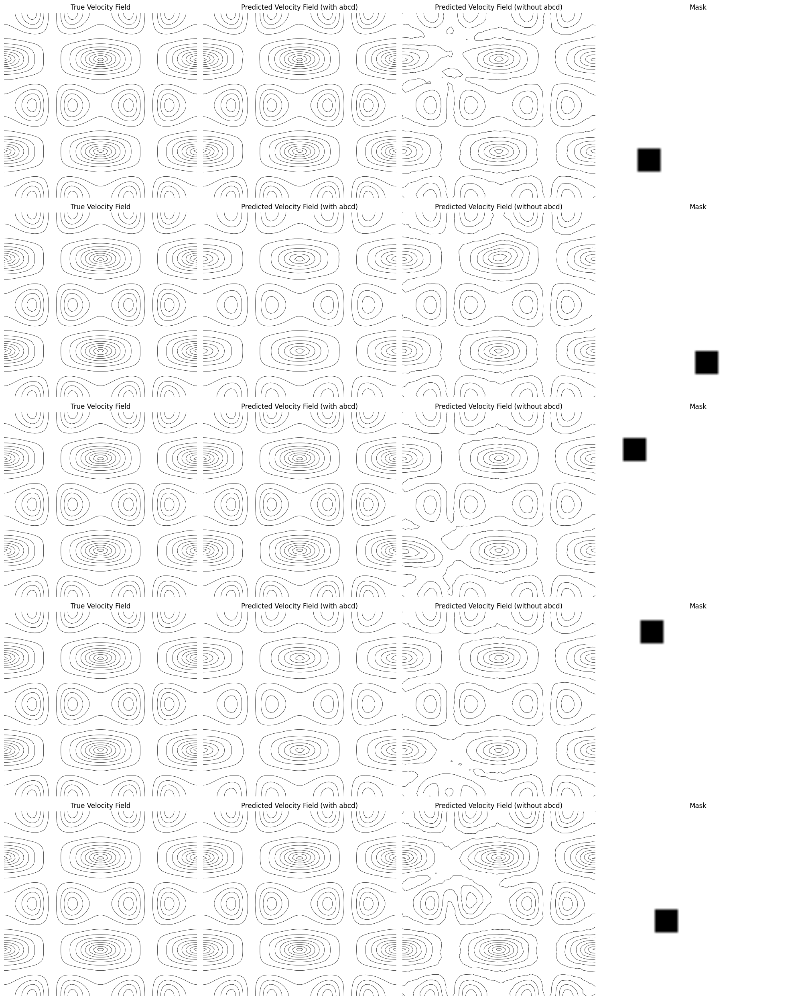

In [9]:
# 可视化结果
def plot_contour(ax, ux, uy, title):
    U_magnitude = np.sqrt(ux**2 + uy**2)
    X, Y = np.meshgrid(np.arange(U_magnitude.shape[1]), np.arange(U_magnitude.shape[0]))
    ax.contour(X, Y, U_magnitude, colors='black', linewidths=0.5)
    ax.set_title(title)
    ax.axis('off')

fig, axs = plt.subplots(num_samples, 4, figsize=(20, 5 * num_samples))

for i in range(num_samples):
    masked_velocity_field = torch.tensor(new_masked_velocity_fields[i]).to(device).float().unsqueeze(0)
    full_velocity_field = new_full_velocity_fields[i]
    mask = new_masks[i]

    # 有abcd模型预测
    with torch.no_grad():
        abcd_pred = model_abcd(masked_velocity_field)
        a_pred, b_pred, c_pred, d_pred = torch.split(abcd_pred.squeeze(0), 1, dim=0)
        a_pred = a_pred.cpu().numpy().squeeze()
        b_pred = b_pred.cpu().numpy().squeeze()
        c_pred = c_pred.cpu().numpy().squeeze()
        d_pred = d_pred.cpu().numpy().squeeze()
        ux_pred_abcd, uy_pred_abcd = calculate_velocity_field(a_pred, b_pred, c_pred, d_pred)

    # 无abcd模型预测
    with torch.no_grad():
        velocity_pred = model_no_abcd(masked_velocity_field)
        ux_pred_no_abcd, uy_pred_no_abcd = torch.split(velocity_pred.squeeze(0), 1, dim=0)
        ux_pred_no_abcd = ux_pred_no_abcd.cpu().numpy().squeeze()
        uy_pred_no_abcd = uy_pred_no_abcd.cpu().numpy().squeeze()

    ux_true, uy_true = full_velocity_field[0], full_velocity_field[1]

    plot_contour(axs[i, 0], ux_true, uy_true, 'True Velocity Field')
    plot_contour(axs[i, 1], ux_pred_abcd, uy_pred_abcd, 'Predicted Velocity Field (with abcd)')
    plot_contour(axs[i, 2], ux_pred_no_abcd, uy_pred_no_abcd, 'Predicted Velocity Field (without abcd)')
    axs[i, 3].imshow(mask, cmap='gray', interpolation='bilinear')
    axs[i, 3].set_title('Mask')
    axs[i, 3].axis('off')

plt.tight_layout()
plt.show()
